In [3]:
import numpy as np
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt
from wave_prop_module import Wave2d
from torch import optim
from unet import UNet
from loss_fns import *
import lpips
import scipy

In [4]:
def get_sobel_kernel_x(k=15):
    # get range
    range = np.linspace(-(k // 2), k // 2, k)
    # compute a grid the numerator and the axis-distances
    x, y = np.meshgrid(range, range)
    sobel_2D_numerator = x
    sobel_2D_denominator = (x ** 2 + y ** 2)
    sobel_2D_denominator[:, k // 2] = 1  # avoid division by zero
    sobel_2D = sobel_2D_numerator / sobel_2D_denominator
    return sobel_2D

def get_sobel_kernel_y(k=15):
    # get range
    range = np.linspace(-(k // 2), k // 2, k)
    # compute a grid the numerator and the axis-distances
    x, y = np.meshgrid(range, range)
    sobel_2D_numerator = y
    sobel_2D_denominator = (x ** 2 + y ** 2)
    sobel_2D_denominator[:, k // 2] = 1  # avoid division by zero
    sobel_2D = sobel_2D_numerator / sobel_2D_denominator
    return sobel_2D

In [5]:
# complete model
device = torch.device('cuda:0')

model_amp = UNet(num_input_channels=1, num_output_channels=1).to(device) # postprocessor
model_phase = UNet(num_input_channels=1, num_output_channels=1).to(device) # postprocessor


# incident wave
X, Y = np.meshgrid(np.linspace(-1, 1, 1024), np.linspace(-1, 1, 1360))

A = torch.tensor([X.T.ravel(), Y.T.ravel(), X.T.ravel()*Y.T.ravel(), X.T.ravel()*X.T.ravel(), Y.T.ravel()*Y.T.ravel(), np.ones_like(X.T.ravel()), 
              (X.T.ravel())**3, (Y.T.ravel())**3, X.T.ravel()*(Y.T.ravel())**2, Y.T.ravel()*(X.T.ravel())**2], dtype=torch.float32).T


# coeffs = torch.rand(10, 1, requires_grad=True)
# coeffs = torch.FloatTensor(10, 1).uniform_(-1, 1)
coeffs = torch.tensor([[ -13.53], [-113.3250], [ -12.7425], [   4.4154], [   6.2158], 
                       [ -119.261], [   2.3329], [  1.3617], [   1.5364], [  3.5796]])
coeffs.requires_grad=True

# obj_amp = torch.rand(1024, 1360, requires_grad=True).to(device)
data = torch.rand(1024, 1360)
data = scipy.ndimage.filters.gaussian_filter(data, 20)
data = torch.tensor(data).to(device)
# obj_phase = torch.rand(1024, 1360, requires_grad=True).to(device)

phase_img = np.load('phase_0.npy')
abs_img = np.load('abs_0.npy')

target_phase = torch.tensor(phase_img).T.to(device)
target_abs = torch.tensor(abs_img).T.to(device)

cons = torch.tensor(3.2, requires_grad=True)
# dist = torch.tensor(155.003, requires_grad=True) # mm 

# loss_fn_alex = lpips.LPIPS(net='alex') 

optimizer = optim.Adam([
    # {'params': obj_phase, 'lr': 1e-1},
    # {'params': obj_amp, 'lr': 1e-1},
    {'params': coeffs, 'lr': 1e-1},
    {'params': cons, 'lr': 1e-2}
    # {'params': dist, 'lr': 1}
    ],
    lr=0.01, betas=(0.9, 0.999)
    )
optimizer_proc = optim.Adam([
    {'params': model_amp.parameters(), 'lr': 1e-3},
    {'params': model_phase.parameters(), 'lr': 1e-3}],
    lr=0.01, betas=(0.9, 0.999)
    )

scheduler = optim.lr_scheduler.StepLR(optimizer_proc, step_size=300, gamma=0.5)

wave_obj = Wave2d(
        numPx = list(data.shape), 
        sizePx = [6*1e-3, 6*1e-3], 
        wl = 550*1e-6
        )

/tmp/ipykernel_1836355/2133543174.py:11: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at /opt/conda/conda-bld/pytorch_1712608843393/work/torch/csrc/utils/tensor_new.cpp:274.)
  A = torch.tensor([X.T.ravel(), Y.T.ravel(), X.T.ravel()*Y.T.ravel(), X.T.ravel()*X.T.ravel(), Y.T.ravel()*Y.T.ravel(), np.ones_like(X.T.ravel()),
/tmp/ipykernel_1836355/2133543174.py:23: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  data = scipy.ndimage.filters.gaussian_filter(data, 20)
/home/kazim/anaconda3/envs/Phase_Unwrap_DIP/lib/python3.8/site-packages/torch/functional.py:512: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at /opt/conda/conda-bld/pytorch_1712608843393/wor

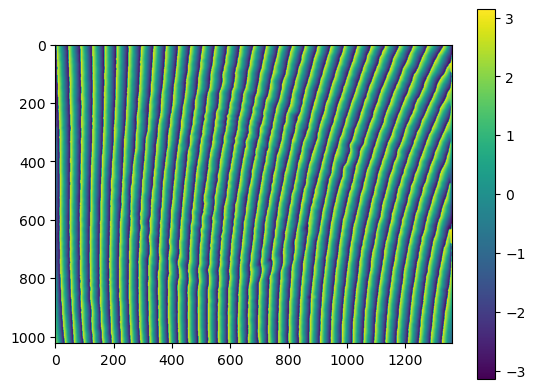

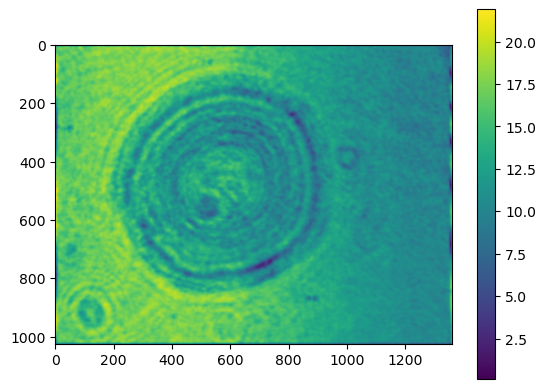

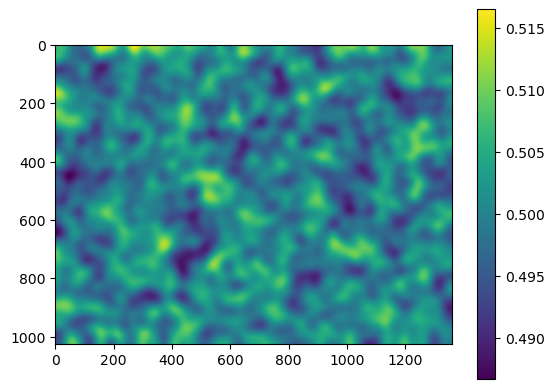

In [6]:
plt.imshow(target_phase.T.cpu())
plt.colorbar()
plt.show()

plt.imshow(target_abs.T.cpu())
plt.colorbar()
plt.show()

plt.imshow(data.cpu().detach())
plt.colorbar()
plt.show()

0 0.18493485597494294


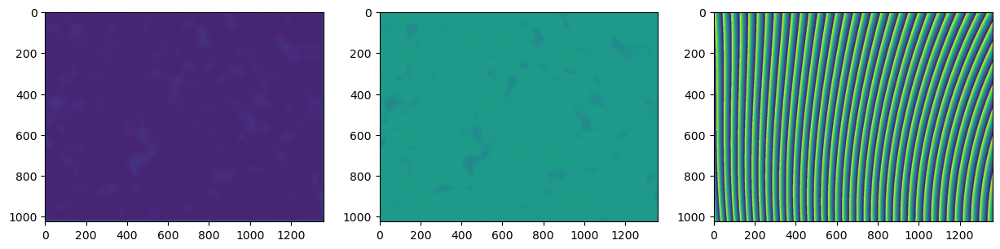

1 0.1810841767123998
2 0.17891148381153918
3 0.1773100567957015
4 0.17625256539996456
5 0.17537189757744817
6 0.1747026929753286
7 0.17429830159408133
8 0.17357419001431365
9 0.17696771084244264
10 0.17614742292868896
11 0.17563781508335638
12 0.17584694158282677
13 0.17568528888587986
14 0.17539156829413877
15 0.17507235733863794
16 0.1748531686441026
17 0.1747352180680099
18 0.17463198367620464
19 0.17449645246441242
20 0.17434831353814187
21 0.17422928506953414
22 0.17413205374041452
23 0.17403283258821237
24 0.17394069625029399
25 0.17384718685427528
26 0.17372181230435046
27 0.17355778046808212
28 0.17341332781415406
29 0.17335434500343666
30 0.17347543083645128
31 0.1733602193870235
32 0.17324627151778432
33 0.17367220021418767
34 0.17329733043710469
35 0.1733764533464954
36 0.17335612876619236
37 0.17327284457330938
38 0.17316014878135036
39 0.17321657904792317
40 0.17308957511394735
41 0.17307972034884814
42 0.17298181504288174
43 0.17293943198986353
44 0.1729045262474271
45 0.

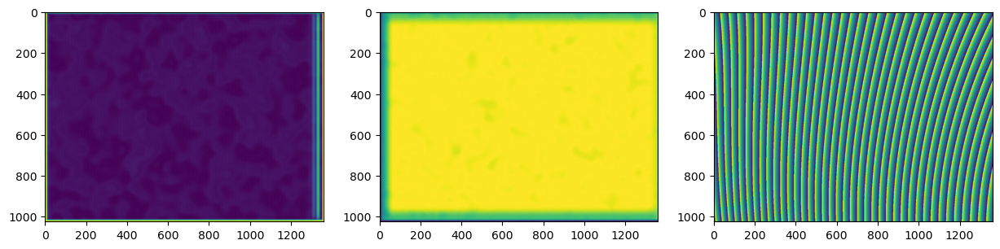

51 0.17295324856634164
52 0.17281617450445833
53 0.17278773252242652
54 0.17271364391768418
55 0.1726719914360782
56 0.17267589531256528
57 0.17261308863036753
58 0.17251147578553466
59 0.172402546937147
60 0.1724388536924275
61 0.17257362659342781
62 0.17457603271281427
63 0.17230879008725927
64 0.17326436445198623
65 0.17352688986567497
66 0.17344383819614384
67 0.1731743582214839
68 0.1729542478801159
69 0.17279617277518272
70 0.1735449267119373
71 0.1736598940799786
72 0.17366179058634917
73 0.17351885730157793
74 0.1730021578364834
75 0.17326070757051207
76 0.17328065051641184
77 0.1732427107008318
78 0.17318297617917447
79 0.17313952410343142
80 0.1730088485335456
81 0.1726102427671978
82 0.17223410423165156
83 0.17220371566517234
84 0.1722781792058868
85 0.172120149385928
86 0.17199765906873274
87 0.1718092204061363
88 0.1718115563225371
89 0.17167998840950408
90 0.17163651827018117
91 0.1715252108666247
92 0.17144488980497413
93 0.171431906988095
94 0.17142207728422634
95 0.171

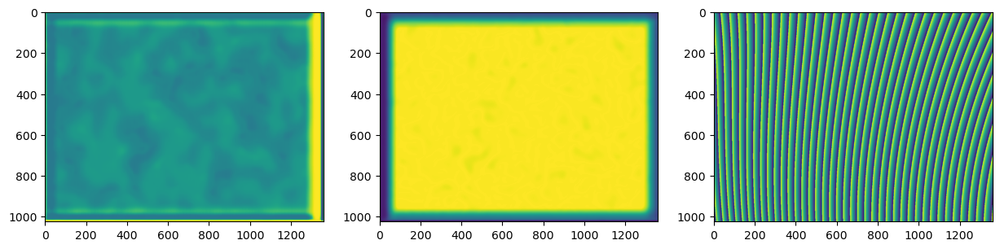

101 0.1712745685495453
102 0.1713033529229022
103 0.17127120391787096
104 0.17123255871012993
105 0.1712057353938776
106 0.1712540352346756
107 0.17119178363257195
108 0.1712220146099161
109 0.17115322215362178
110 0.1712179840899872
111 0.17118678565722853
112 0.17115025806140208
113 0.1711460400865037
114 0.1711226757319839
115 0.1711479057442313
116 0.1711156850009694
117 0.17113128934137087
118 0.1710874695603868
119 0.171094879363536
120 0.1710792922264804
121 0.17106744931595766
122 0.1710704596663541
123 0.17120874828994836
124 0.1711464366685171
125 0.1713143877640287
126 0.17119210507406915
127 0.1711281761867946
128 0.17123633182477616
129 0.1711274209971473
130 0.17110559069943346
131 0.17111777694483302
132 0.17109724902126158
133 0.17109028101632506
134 0.17108343300577367
135 0.17105879034167168
136 0.17105339058501295
137 0.1710612117458552
138 0.171056517745541
139 0.17104274160397645
140 0.1710202842765954
141 0.17177604581528308
142 0.1720148122862623
143 0.1717336017

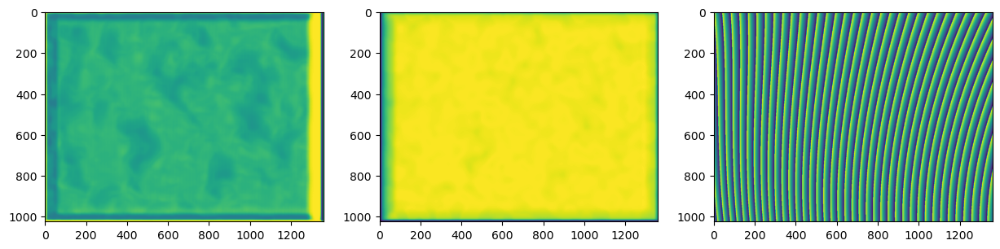

151 0.17242183636050915
152 0.17227173467726098
153 0.17221892929385246
154 0.172024845258403
155 0.1719375696045136
156 0.17181119813283902
157 0.17174296980692316
158 0.17161663413600295
159 0.17158390876797025
160 0.17153869941996572
161 0.17152132446244356
162 0.17144056755256243
163 0.1713672296896447
164 0.17132803220654313
165 0.1713012022182239
166 0.171284547209544
167 0.17126692591214424
168 0.17123596470202382
169 0.1712043312834275
170 0.17118204058228847
171 0.17114587506798837
172 0.1711461386644831
173 0.17110536912241134
174 0.17110293828150336
175 0.17109836418699434
176 0.17107304538438975
177 0.17110077591922412
178 0.17105365246209656
179 0.17105189662189402
180 0.17104910657191813
181 0.17104207366364962
182 0.17104480139086442
183 0.17100417204223545
184 0.1710238240231403
185 0.17099778959056341
186 0.1709961108476661
187 0.17097583146900228
188 0.17095741205371134
189 0.17095074747160557
190 0.17095253919520953
191 0.17093838334294958
192 0.17092158339953237
193

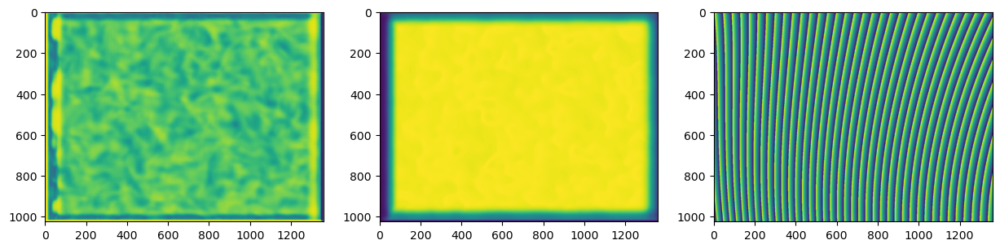

201 0.17082619449622338
202 0.17082648749829174
203 0.17076816084228133
204 0.1707848621412278
205 0.1707697884178662
206 0.17074823946801004
207 0.17078205315967124
208 0.17071994919245465
209 0.17072449767888362
210 0.17066493768994934
211 0.1706699311956943
212 0.17063593680479927
213 0.17059219777794338
214 0.17063429000299105
215 0.17053575587081504
216 0.17053152911450623
217 0.17049331951960847
218 0.17052865045628934
219 0.17049909622899476
220 0.1704400787235766
221 0.1704105636336734
222 0.1703760233988279
223 0.1704841560842661
224 0.17037625457674435
225 0.1703328597680011
226 0.17034403450378793
227 0.1703183619598941
228 0.17021370132654062
229 0.1702535753045083
230 0.17014521938823185
231 0.17011028097124115
232 0.1701603173446041
233 0.17021523600237504
234 0.17000380738912765
235 0.1700153191362107
236 0.1699004903374616
237 0.169845762013956
238 0.1698507803873248
239 0.16985409155923303
240 0.1698530665048205
241 0.16972815730687799
242 0.16966417707896575
243 0.169

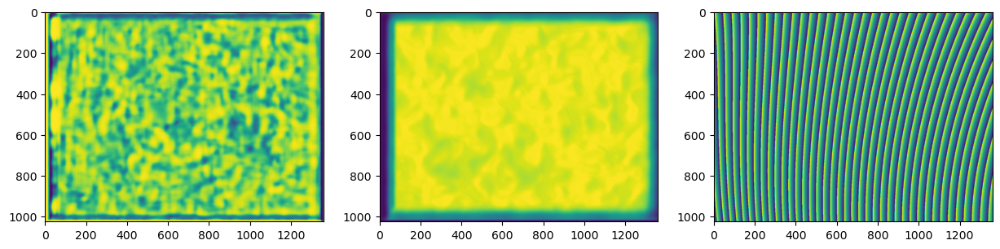

251 0.16929562728693104
252 0.16925325727458046
253 0.1693558578042687
254 0.169379452531431
255 0.1693327132057617
256 0.1691198483612497
257 0.16901874492844512
258 0.16895232210504438
259 0.16886891936300125
260 0.16882178680842808
261 0.1686886473408286
262 0.16864797894115602
263 0.16850065571718084
264 0.16845286223514835
265 0.16835266559949863
266 0.16836674469803936
267 0.16834480448582925
268 0.1684307186262483
269 0.1686619200180934
270 0.16835042378984347
271 0.16842710985541284
272 0.16850680480134117
273 0.16842188803473354
274 0.16808030563059057
275 0.16807116353486987
276 0.16798669790176549
277 0.16785257557093466
278 0.16777497043400813
279 0.16776176518407543
280 0.16748699741109058
281 0.1675337741931961
282 0.16731862349172216
283 0.1672878099911538
284 0.1672295906309803
285 0.16726237480580744
286 0.16714341365726765
287 0.16694104139503455
288 0.16699214776308222
289 0.16680831528857498
290 0.1668712469366357
291 0.1669213609939668
292 0.16652138417204712
293 0

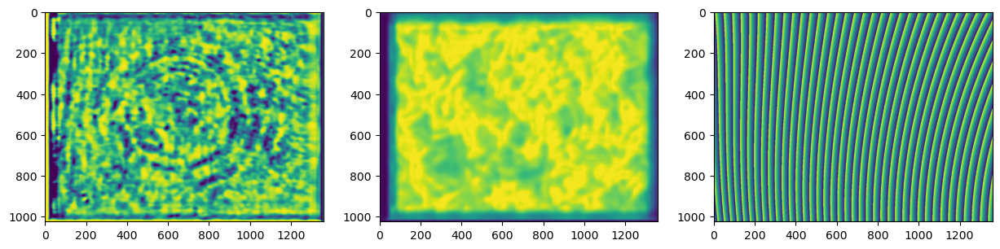

301 0.1657272436582651
302 0.16582044705049442
303 0.1657787901827043
304 0.1655540277540135
305 0.16545752632928107
306 0.16536857980824488
307 0.16532051779923487
308 0.1652230967332681
309 0.16512863287214435
310 0.16500414288641746
311 0.1649230529189883
312 0.16484490401522817
313 0.16474317676866762
314 0.16469868643947103
315 0.16464567076483339
316 0.16449020092955766
317 0.16436229425183257
318 0.16430869832207246
319 0.16433773659982523
320 0.16419647917744468
321 0.1641917994460736
322 0.1642350281689845
323 0.16387936373969886
324 0.1640236420274156
325 0.16385137606911723
326 0.16369690800851897
327 0.16370542706211402
328 0.16374002147012742
329 0.16347850791499918
330 0.1634313471145271
331 0.1633649533898293
332 0.1631612637652385
333 0.16312617041444966
334 0.16298778164403407
335 0.16316251952409236
336 0.16323436722865273
337 0.16293931548770427
338 0.16310501119427992
339 0.16280040138055712
340 0.16275846389942442
341 0.1626317427032748
342 0.1625024064322551
343 0

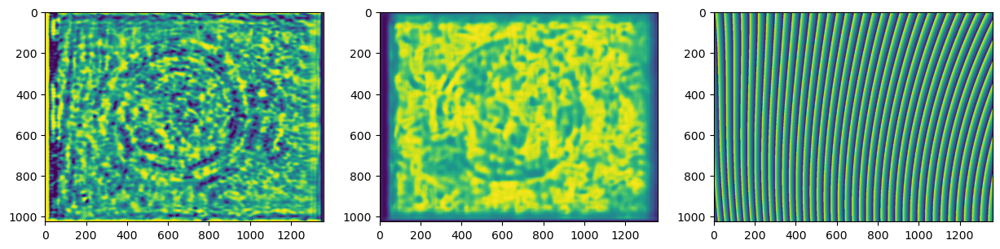

351 0.16211984559089118
352 0.16168114828533656
353 0.16145231120164866
354 0.1615017091600205
355 0.16099323219962675
356 0.16083484844232793
357 0.1605915899049961
358 0.1602713046369441
359 0.1602412971465077
360 0.15972568704971374
361 0.15969063375027762
362 0.15948205068014912
363 0.15940922014077516
364 0.159504368334578
365 0.15956463182551842
366 0.1588734949309354
367 0.15920773650191825
368 0.1589503965847101
369 0.15879530338878986
370 0.15847991888525498
371 0.1584056540537687
372 0.15800271902576382
373 0.1578455132357947
374 0.15761793650051306
375 0.15756519608329672
376 0.15772809355594838
377 0.15802993638129925
378 0.1576513632331537
379 0.15741217302472085
380 0.15710510488971643
381 0.1570704877604162
382 0.15696708978540108
383 0.15690126938546908
384 0.156370594432033
385 0.1562562314557801
386 0.15604522511303745
387 0.15606658213328806
388 0.15611371998363305
389 0.15613059677585792
390 0.15649695128016022
391 0.15570511650862517
392 0.15580234755450204
393 0.1

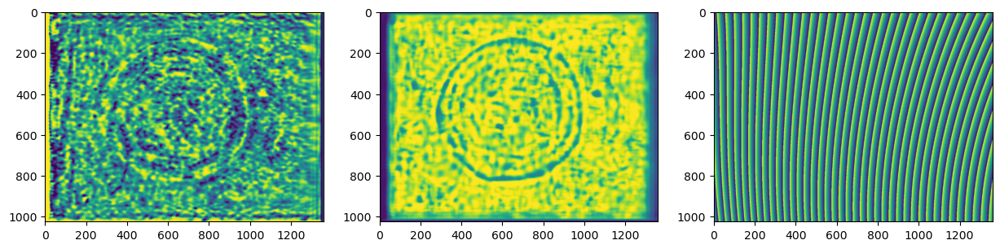

401 0.15509039913908126
402 0.15492257157778674
403 0.1548685582337889
404 0.15444656709715193
405 0.15428364952775153
406 0.15399451950419146
407 0.15376972653007107
408 0.15373416193181663
409 0.15355572964968595
410 0.1531123227840619
411 0.1530338605345549
412 0.15287072382839603
413 0.15278331177471174
414 0.15316348335586727
415 0.15347544091138954
416 0.15329326857154643
417 0.15246161641217423
418 0.15332906743033867
419 0.15370704309378624
420 0.1528450103097068
421 0.15320149096377525
422 0.15207752155582263
423 0.15260630324089167
424 0.15167493399985765
425 0.15186468540056267
426 0.15141598307055565
427 0.1515951372889338
428 0.1509188765043609
429 0.15124177109734516
430 0.1507429654685518
431 0.15097464768959293
432 0.15086642410574397
433 0.1509757077557078
434 0.15091987879882962
435 0.15054315861790754
436 0.15049646692154123
437 0.15072909685571992
438 0.15055744878962687
439 0.1500332722572273
440 0.15001492795375357
441 0.1495849783484984
442 0.1493208553923116
443

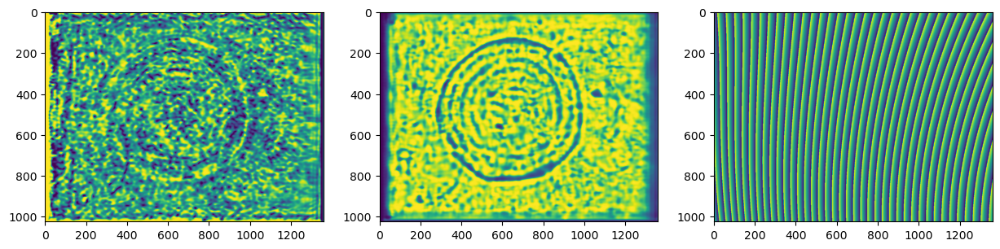

451 0.1495163213152025
452 0.14902041557598197
453 0.14876950884481235
454 0.1488633749226506
455 0.14858784317192839
456 0.14839809080721342
457 0.14799210050225467
458 0.14800489150498508
459 0.14768179204598683
460 0.14794141707141875
461 0.14823771979779632
462 0.14760154193686167
463 0.1471008979518101
464 0.14745096994686693
465 0.14816167617461173
466 0.14796916417445433
467 0.1468707241761263
468 0.14743542617388172
469 0.1470358360462597
470 0.14681716193551875
471 0.1477346003672063
472 0.14684493653651928
473 0.14707620144431863
474 0.14610297390049518
475 0.1465480719306748
476 0.14624786130326126
477 0.14638616716889097
478 0.14688868772803879
479 0.1460651260699214
480 0.14562650768962876
481 0.14632149535439648
482 0.14577152630253198
483 0.14545531799839656
484 0.14520986621949
485 0.14547604322946428
486 0.1452679083311514
487 0.14512728912707587
488 0.14474962113941608
489 0.14488118918781406
490 0.14451023121916948
491 0.1443862274230415
492 0.14423279414493356
493 0

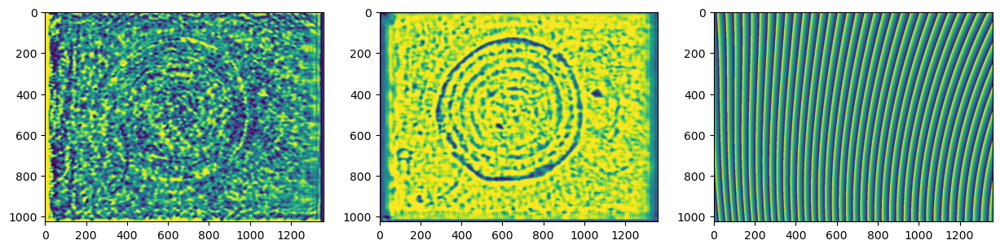

501 0.14408290202468974
502 0.145160130982127
503 0.14542264052407752
504 0.14436889568912223
505 0.1449402384221363
506 0.14448204768616799
507 0.14411543002245092
508 0.1438872531636376
509 0.14385438421383095
510 0.14347773692305202
511 0.14345054017455008
512 0.14296956621205695
513 0.14298468150108032
514 0.14279829372773106
515 0.14246105977957627
516 0.14244690864854406
517 0.14213617663170988
518 0.14235146535137816
519 0.14254132898384075
520 0.14232133329801008
521 0.14245329872245763
522 0.14211910053616605
523 0.1419545877794834
524 0.14164828457827022
525 0.14212138023120907
526 0.14227300627508818
527 0.1418259757781104
528 0.1414134753567626
529 0.14150507492498618
530 0.14185267121763673
531 0.14140983121725886
532 0.14125943268402477
533 0.14146200255041622
534 0.1418855219942401
535 0.14107659695873265
536 0.1415300811400228
537 0.14081554100459512
538 0.14075725406994113
539 0.1411808545639845
540 0.14170169221824366
541 0.14074423776532177
542 0.14083447358810902
54

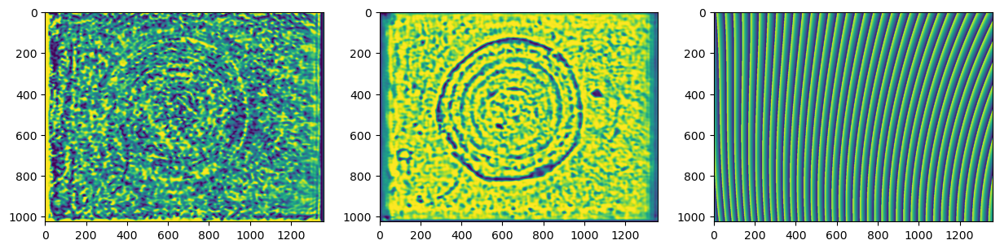

551 0.13993464171803036
552 0.13988481215231727
553 0.13983937839620936
554 0.14023635873898016
555 0.1400868333299995
556 0.13976764160273913
557 0.13968296955763013
558 0.13951419620436148
559 0.14012495390135307
560 0.13986847859021992
561 0.14002967769636934
562 0.13957764445955673
563 0.14026134611926636
564 0.1395329271749913
565 0.13884408862480488
566 0.1392048307365352
567 0.13930165154703916
568 0.1391375103703362
569 0.1390411663517865
570 0.1398014500864172
571 0.1391949842972833
572 0.13940194174372394
573 0.13879710659936256
574 0.13879603425570503
575 0.13904152501023143
576 0.1388570187394272
577 0.13909047211366674
578 0.13911182279137446
579 0.138737809879537
580 0.13875232104119178
581 0.1384871258341073
582 0.13834967694245118
583 0.1389852384409067
584 0.13922541600832902
585 0.13865231829968608
586 0.13879832947177106
587 0.1387779044505297
588 0.13828966980192747
589 0.13860875786381385
590 0.1382460758117445
591 0.13834366995062178
592 0.13819040616966125
593 0.

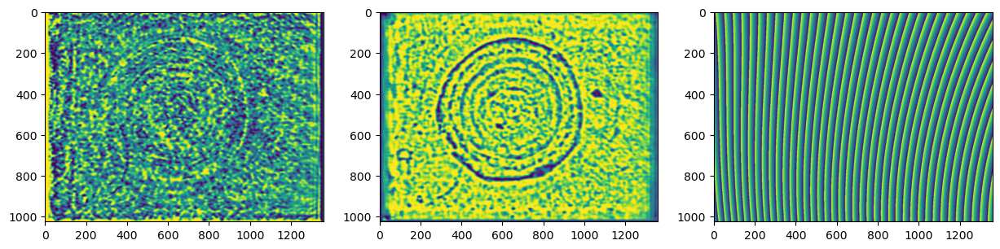

601 0.13671166144120353
602 0.13689298183273946
603 0.13659640922519545
604 0.1365825381341716
605 0.13646826395622333
606 0.1363732863947275
607 0.13630515258747275
608 0.13619201367842576
609 0.13610670855794899
610 0.1360810852656586
611 0.13595740715159535
612 0.1359158616495954
613 0.13585702692850676
614 0.13579504451652574
615 0.13575311208050814
616 0.13567629262465794
617 0.13562737357344679
618 0.13556987222073524
619 0.13552102977181374
620 0.1355022116059583
621 0.13548450495446657
622 0.1354785056755905
623 0.13539204512268227
624 0.13538795158605937
625 0.13535376461954232
626 0.13527766709934075
627 0.1352591134198199
628 0.13520512714175084
629 0.13514683313810533
630 0.13510653230216585
631 0.13505782700794988
632 0.13504967536734097
633 0.13505126234249948
634 0.13510611208807194
635 0.1352316622855676
636 0.13520191752414334
637 0.13522429391674046
638 0.1350828211649012
639 0.1349938743682381
640 0.13493367216188568
641 0.13494557318538591
642 0.13500956700552888
64

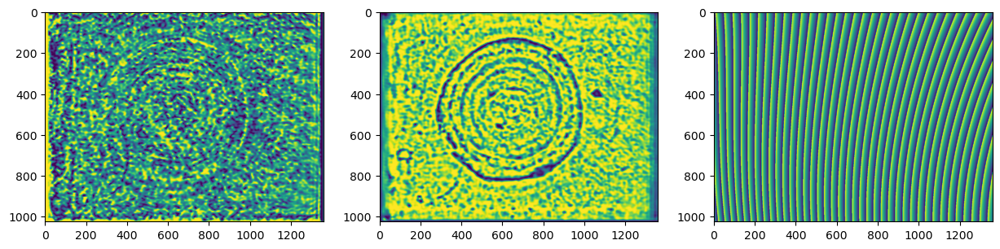

651 0.13464075346743948
652 0.1347979134197627
653 0.13476129768445436
654 0.13508314723094406
655 0.13480462351366565
656 0.13475149013661533
657 0.13476666647356328
658 0.13475975482122182
659 0.1346268859504026
660 0.1345440997921605
661 0.13465097957949226
662 0.1345771159945433
663 0.13450904290217414
664 0.1343875166488149
665 0.1343643476613936
666 0.13431170555274327
667 0.13448896364863275
668 0.1345897078268079
669 0.13467169286180056
670 0.1345278299218151
671 0.13436008157717616
672 0.1342447282301482
673 0.13434370005222215
674 0.13438299506120793
675 0.13432212697798376
676 0.13410038563087878
677 0.13405152356622366
678 0.13414705076196853
679 0.13422648345158572
680 0.13415027162415194
681 0.13394132227746874
682 0.13405194674890375
683 0.13412091798347334
684 0.1341443893621792
685 0.13405035961565437
686 0.13403876979648266
687 0.1339705621787112
688 0.13397695780609756
689 0.13399124560816292
690 0.13400748127087203
691 0.13399922581761445
692 0.13385774784494398
693

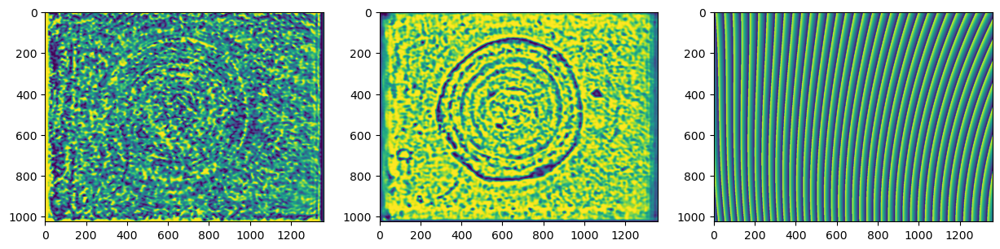

701 0.13465230715875404
702 0.1345919084943742
703 0.13441285663961466
704 0.1343387643851048
705 0.1342422548280183
706 0.13408840759973442
707 0.13404067288637614
708 0.13398160438535825
709 0.13394933182780833
710 0.1338347089077354
711 0.13371203630061287
712 0.13368929656060888
713 0.13379397771198842
714 0.13385208222587947
715 0.13402447998982
716 0.13394632641421061
717 0.133964643192798
718 0.1337889546054884
719 0.13381653087402123
720 0.13373818449164793
721 0.1337138822298615
722 0.13356617325160228
723 0.1335942171497585
724 0.13347420506119037
725 0.13331343245498095
726 0.13330435268345528
727 0.13340189089747728
728 0.1334473970259558
729 0.13348030728862498
730 0.13348135143865947
731 0.1333644158818294
732 0.1335104079491961
733 0.13338987634905586
734 0.13332027525831197
735 0.13329567626197933
736 0.13349182553635722
737 0.13346811258927335
738 0.13331892727228342
739 0.1332303337986802
740 0.1332835177923152
741 0.1334580405368702
742 0.13328265025551153
743 0.1334

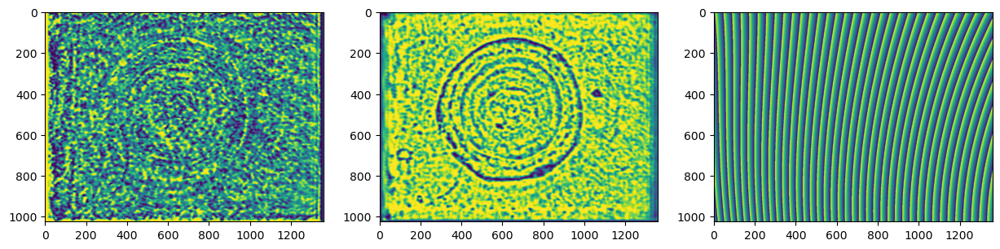

751 0.13292700100338622
752 0.13287990013137727
753 0.13283488705387583
754 0.13285796430656543
755 0.13298512606266327
756 0.13284755093924625
757 0.132935178639183
758 0.13293070923407893
759 0.13294895183515387
760 0.13303283042273645
761 0.1330494953188374
762 0.13287619211596957
763 0.132687219820629
764 0.13272548656446323
765 0.13282948072339987
766 0.1329032730560068
767 0.1326988242726489
768 0.13265239004994628
769 0.13264536414282732
770 0.13269275902315816
771 0.1326492990514734
772 0.1326009167369126
773 0.1325524704969262
774 0.13254408196336373
775 0.13268621963952054
776 0.13268843695255822
777 0.13263684614112994
778 0.1325066043117674
779 0.13256150213510265
780 0.1326212236423718
781 0.13275539815580867
782 0.1325823518309846
783 0.13266810136303953
784 0.13243765486018694
785 0.13248630215942575
786 0.13237421221144138
787 0.13237155017612984
788 0.13242079725225037
789 0.13245675678766122
790 0.13239526828043036
791 0.1324927397560114
792 0.13246350656660275
793 0.

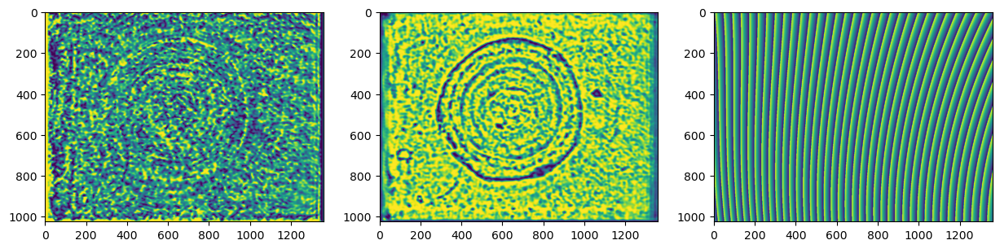

801 0.13220133675169948
802 0.13222851653212328
803 0.1323043131472533
804 0.1321580350810024
805 0.13203261561674737
806 0.13238421978791814
807 0.13227011983929834
808 0.13210933618475929
809 0.1320454188391041
810 0.13211530835890462
811 0.13199925025011872
812 0.132134412812303
813 0.13207295375409908
814 0.13205959161609965
815 0.1319297905147228
816 0.1319140106878723
817 0.13190439256008088
818 0.13201692439759105
819 0.13199199582836088
820 0.13198341634772873
821 0.13200068523288144
822 0.13184414471646766
823 0.13187494193373994
824 0.13195156804193134
825 0.13211549778342155
826 0.1319872270375708
827 0.13205264644734277
828 0.13177604607368407
829 0.13179265953628327
830 0.13187999011211357
831 0.1317999299146804
832 0.13186261471065186
833 0.13175402721037652
834 0.13180465033579242
835 0.13164811307722676
836 0.13157813637444293
837 0.13166899935154694
838 0.13175819683998202
839 0.13172663555142283
840 0.13183190664202799
841 0.13190840537774293
842 0.1317837271042365
84

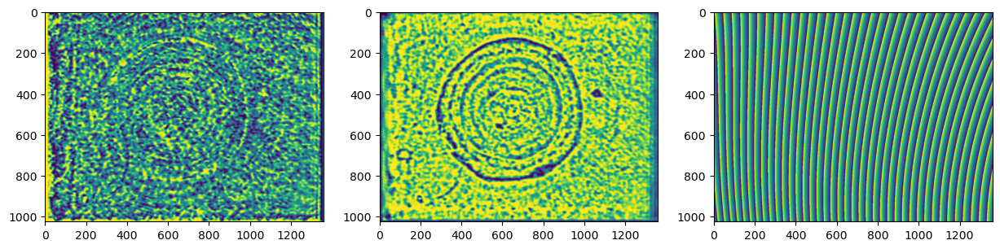

851 0.13164403436767297
852 0.13168746951408766
853 0.13153048482105828
854 0.13129163772520905
855 0.1313799435395723
856 0.13168700103917064
857 0.13154877956410677
858 0.13159973771514935
859 0.13143225798576533
860 0.13151850117714226
861 0.13141958048986935
862 0.13143570349536582
863 0.13149311553171938
864 0.131799399721665
865 0.13143537021250656
866 0.13146428275922348
867 0.13133446801565024
868 0.13119722274390383
869 0.13112433199022633
870 0.13117336635912624
871 0.1312295079507598
872 0.13131422426236342
873 0.1314655578932599
874 0.131286127955864
875 0.13129700713869705
876 0.13115583672755002
877 0.13123359677090593
878 0.13126890891758042
879 0.131317087823988
880 0.1314885339383771
881 0.13131280394366351
882 0.13113358332764136
883 0.131030021921931
884 0.13116761907833413
885 0.13110360713252817
886 0.13100291122048396
887 0.1309343449448755
888 0.13094449195910868
889 0.13103204408931574
890 0.13118413244555935
891 0.13111538669636685
892 0.1311421857214033
893 0.

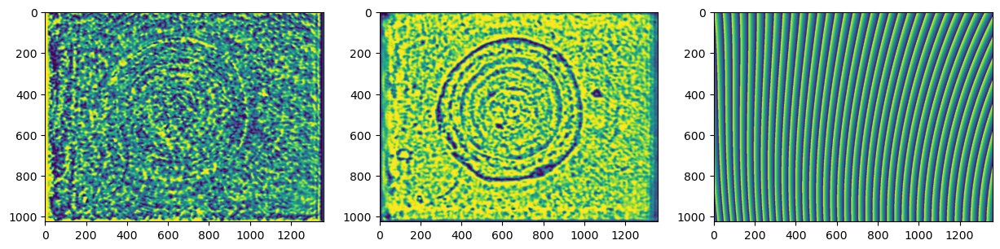

901 0.13036898363869062
902 0.13075193206591
903 0.13038349363454718
904 0.13058350566602406
905 0.13036850908319716
906 0.13045340167766883
907 0.13033376231618388
908 0.13036009595623654
909 0.1302797126242662
910 0.13028179062846834
911 0.1302358597370587
912 0.13022055465848234
913 0.1301972501437266
914 0.1301647368309799
915 0.13015936870486794
916 0.13011170362630592
917 0.1301002373497667
918 0.13008100863480218
919 0.13005954806179865
920 0.13005122180051312
921 0.1300351777628823
922 0.1300134070366208
923 0.13000866128783875
924 0.129993302583011
925 0.13000284690011743
926 0.1299655998103867
927 0.12995710149985037
928 0.1299713406789955
929 0.1299731743320261
930 0.12996106412129135
931 0.12992244054119406
932 0.12991531818316573
933 0.12994287357038872
934 0.12996569508100433
935 0.12992716684332917
936 0.1299286418531609
937 0.12991985927405666
938 0.12990018223840025
939 0.12988395285642665
940 0.12986919778469241
941 0.12985503444386048
942 0.12983491920202947
943 0.12

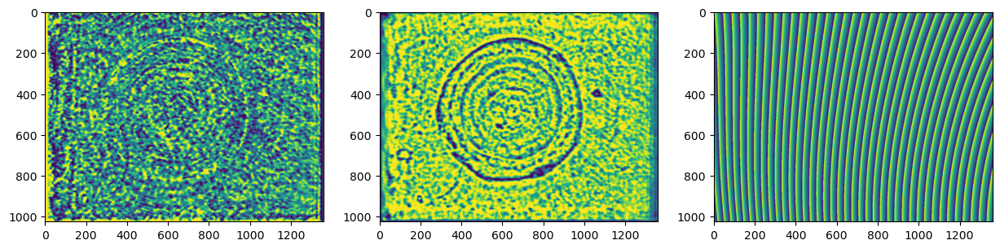

951 0.12977023145574798
952 0.1297740381939263
953 0.12975932871017398
954 0.12977437176140255
955 0.12978566540469855
956 0.12979052352914913
957 0.1297522361225741
958 0.12974164870338678
959 0.1297358771366864
960 0.12974813779915445
961 0.12975878231230578
962 0.12974989984314889
963 0.12975638472023632
964 0.12977615115330146
965 0.12974034555724925
966 0.12972335142047572
967 0.12972904127125623
968 0.12970919527058616
969 0.12969780144402243
970 0.12965692478797233
971 0.12964739689121801
972 0.12964972578517128
973 0.12968785432198185
974 0.12975119549843403
975 0.12974073444431988
976 0.12968160168518664
977 0.12965221895002896
978 0.1296666452311177
979 0.12967858954895595
980 0.1296598124609236
981 0.12966388153760575
982 0.12968043569575266
983 0.1296411381550407
984 0.12960006038115557
985 0.12959539308625986
986 0.12960646662510636
987 0.12962481241842636
988 0.1295979275711552
989 0.1295924156305381
990 0.12957670607735153
991 0.12956869226249318
992 0.12959973209962763


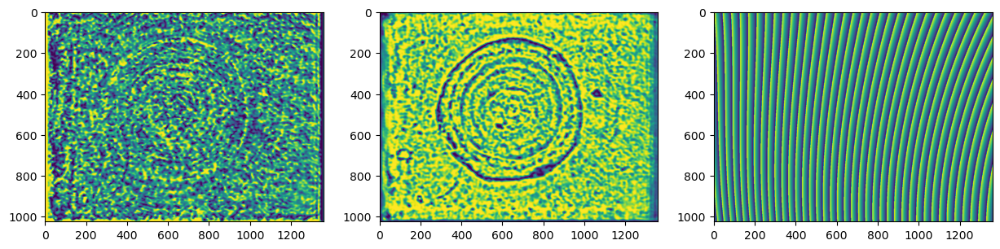

In [7]:
epochs = 1001
loss_arr = []


for itr in range(epochs):

    optimizer.zero_grad()
    optimizer_proc.zero_grad()

    obj_amp = model_amp(data.detach().unsqueeze(0).unsqueeze(0)).squeeze()
    obj_phase = model_phase(data.detach().unsqueeze(0).unsqueeze(0)).squeeze()
    obj = obj_amp*torch.exp(1j*obj_phase)
    
    wave_phase = ((A)@coeffs).reshape(1024, 1360)
    wave = torch.exp(1j*wave_phase).to(device)
    
    wave_op = wave*obj

    wave_obj.wavefield(wave_op.T)
    dist = torch.tensor(155.003) # mm
    wave_at_img = wave_obj.propogate(dist)

    wave_z_amp = torch.abs(wave_at_img).float().to(device)
    wave_z_phase = torch.angle(wave_at_img).float().to(device) + cons.to(device)

    # wave_z_amp_proc = model_amp(wave_z_amp.unsqueeze(0).unsqueeze(0)).squeeze()
    # wave_z_phase_proc = model_amp(wave_z_phase.unsqueeze(0).unsqueeze(0)).squeeze()

    # loss_proc = 0.9*l2_loss(proc, obj_phase) + total_variation_loss(proc, 0.1)
    
    loss_amp = loss_fn(wave_z_amp, target_abs)
    loss_phase = loss_fn(wave_z_phase, target_phase)
    # loss_amp = l2_loss(torch.abs(wave_at_img).float(), target_abs.float())

    loss = 1*loss_amp + 1*loss_phase
    # + total_variation_loss(obj_phase, 0.2) + total_variation_loss(obj_amp, 0.1)
    # + 0.1*l2_loss(wave_z_amp, wave_z_amp_proc) + 0.1*l2_loss(wave_z_phase, wave_z_phase_proc)
    # + 1/(grad_x.ravel().abs().mean() + grad_y.ravel().abs().mean())

    # 

    loss.backward()
    # loss_proc.backward()
    
    optimizer.step()
    optimizer_proc.step()
    scheduler.step()

    loss_arr.append(loss.item())
    print(itr, loss_arr[-1]
        #   , dist.item(), 
        #   (grad_x.ravel().abs().mean() + grad_y.ravel().abs().mean()).abs().item()
          ) 

    if (itr) % 50 == 0:

        fig, axs = plt.subplots(1, 3, figsize=(15, 8))

        axs[0].imshow(obj_phase.cpu().detach())
        # axs[1].imshow(proc.detach())
        axs[1].imshow(obj_amp.cpu().detach())
        axs[2].imshow(torch.angle(wave.cpu().detach()))

        plt.show()

In [10]:
dist, dist.grad, cons.grad, coeffs.grad, coeffs

(tensor(155.0030),
 None,
 tensor(-5.8208e-11),
 tensor([[ 3.7271e-05],
         [ 8.1912e-05],
         [ 2.5369e-05],
         [-7.5952e-05],
         [ 4.7749e-05],
         [-1.0041e-09],
         [ 5.8873e-05],
         [ 9.6828e-05],
         [ 2.1443e-05],
         [ 9.7089e-06]]),
 tensor([[ -12.4583],
         [-114.4938],
         [ -13.4447],
         [   4.2434],
         [   5.9928],
         [-117.5789],
         [   2.3082],
         [   1.0146],
         [   1.4772],
         [   3.3980]], requires_grad=True))

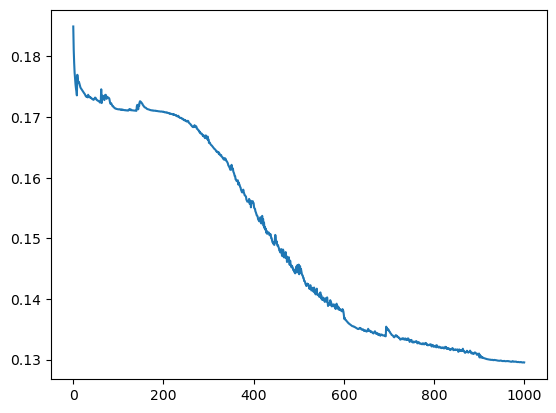

In [8]:
plt.plot(loss_arr)

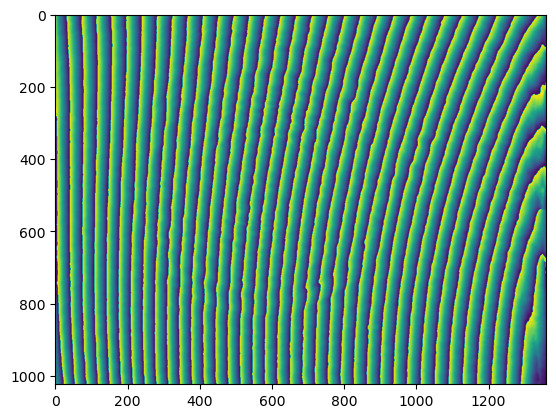

In [10]:
plt.imshow(wave_z_phase.cpu().detach().T)

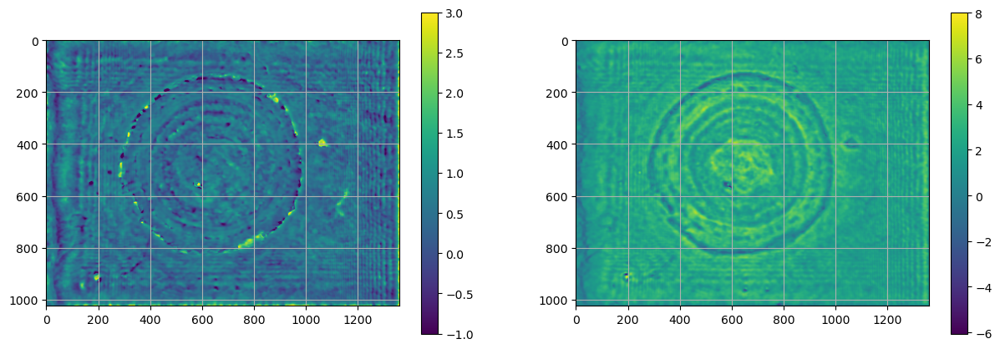

In [141]:
fig, axs = plt.subplots(1, 2, figsize=(15, 5))

cm1 = axs[1].imshow(obj_amp.detach())
cm0 = axs[0].imshow(obj_phase.detach(), vmin=-1, vmax=3)

fig.colorbar(cm0, ax=axs[0])
fig.colorbar(cm1, ax=axs[1])

axs[0].grid()
axs[1].grid()

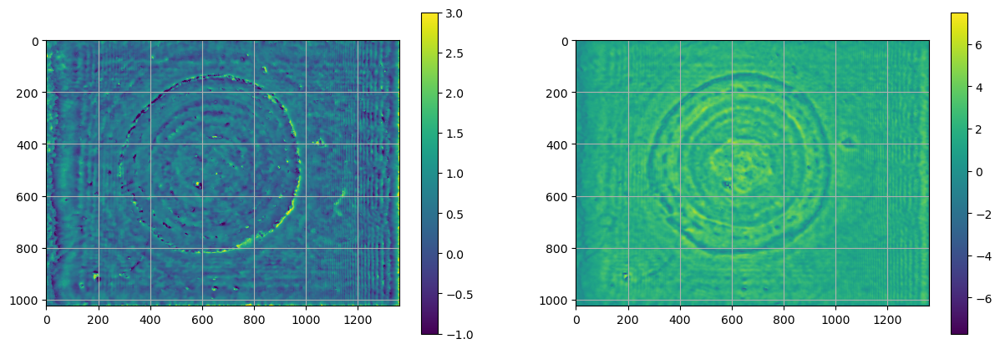

In [ ]:
fig, axs = plt.subplots(1, 2, figsize=(15, 5))

cm1 = axs[1].imshow(obj_amp.detach())
cm0 = axs[0].imshow(obj_phase.detach(), vmin=-1, vmax=3)

fig.colorbar(cm0, ax=axs[0])
fig.colorbar(cm1, ax=axs[1])

axs[0].grid()
axs[1].grid()

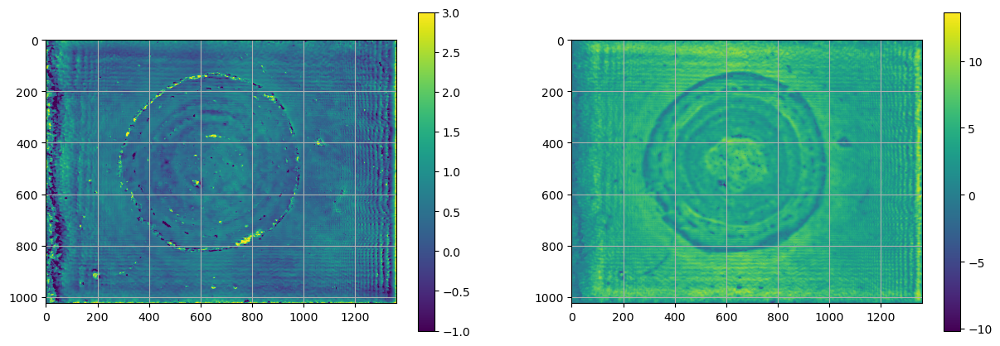

In [ ]:
fig, axs = plt.subplots(1, 2, figsize=(15, 5))

cm1 = axs[1].imshow(obj_amp.detach())
cm0 = axs[0].imshow(obj_phase.detach(), vmin=-1, vmax=3)

fig.colorbar(cm0, ax=axs[0])
fig.colorbar(cm1, ax=axs[1])

axs[0].grid()
axs[1].grid()

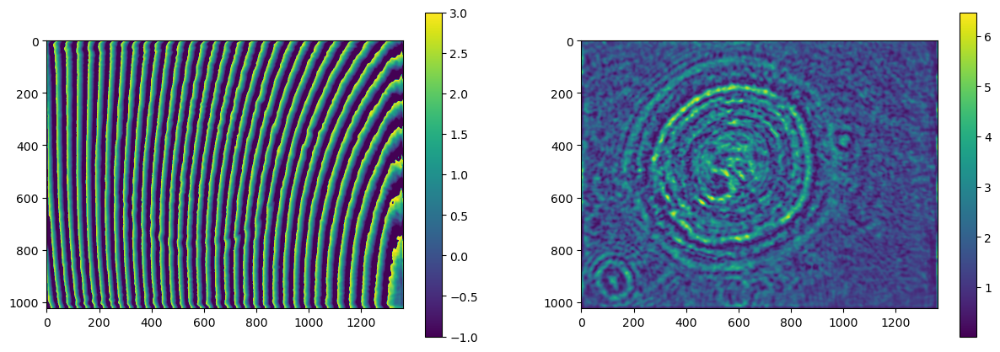

In [ ]:
fig, axs = plt.subplots(1, 2, figsize=(15, 5))

cm1 = axs[1].imshow(torch.abs(wave_at_img).T.detach())
cm0 = axs[0].imshow(torch.angle(wave_at_img).T.detach(), vmin=-1, vmax=3)

fig.colorbar(cm0, ax=axs[0])
fig.colorbar(cm1, ax=axs[1])

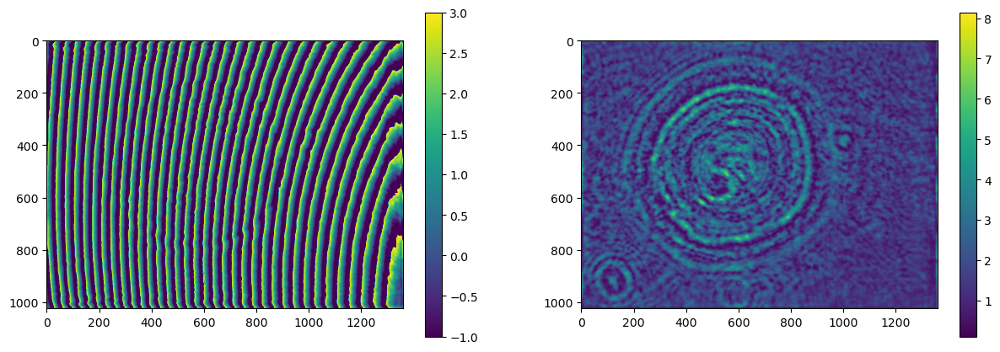

In [ ]:
fig, axs = plt.subplots(1, 2, figsize=(15, 5))

cm1 = axs[1].imshow(torch.abs(wave_at_img).T.detach())
cm0 = axs[0].imshow(torch.angle(wave_at_img).T.detach(), vmin=-1, vmax=3)

fig.colorbar(cm0, ax=axs[0])
fig.colorbar(cm1, ax=axs[1])

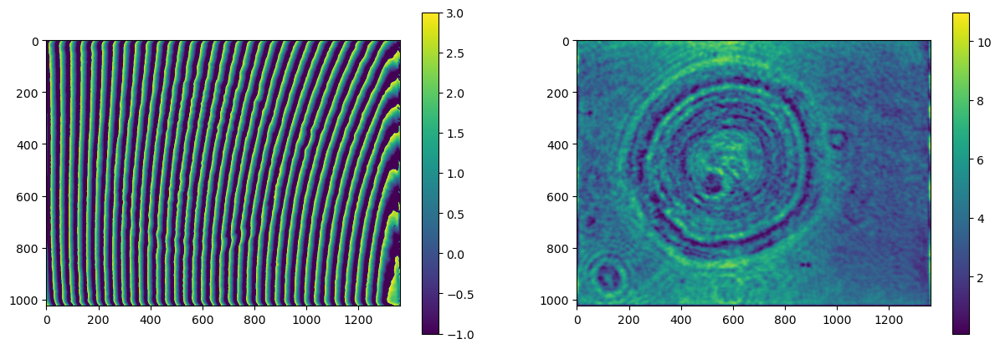

In [ ]:
fig, axs = plt.subplots(1, 2, figsize=(15, 5))

cm1 = axs[1].imshow(torch.abs(wave_at_img).T.detach())
cm0 = axs[0].imshow(torch.angle(wave_at_img).T.detach(), vmin=-1, vmax=3)

fig.colorbar(cm0, ax=axs[0])
fig.colorbar(cm1, ax=axs[1])

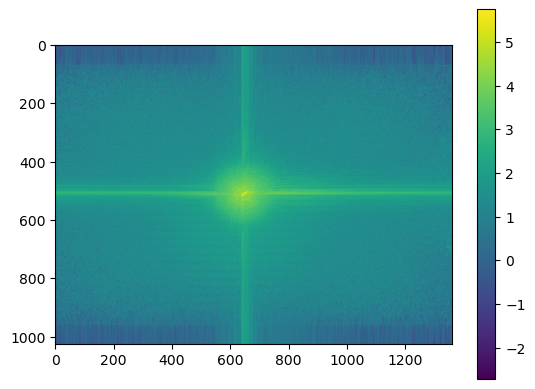

In [ ]:
plt.imshow(np.log10(torch.abs(torch.fft.fftshift(torch.fft.fft2(wave_at_img.detach())))).T)
plt.colorbar()

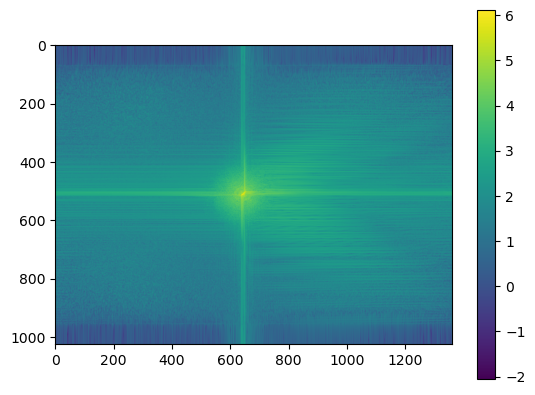

In [ ]:
plt.imshow(np.log10(torch.abs(torch.fft.fftshift(torch.fft.fft2(wave_at_img.detach())))).T)
plt.colorbar()

tensor([[ -12.7241],
        [-114.5435],
        [ -12.9551],
        [   4.7421],
        [   6.8633],
        [-118.1326],
        [   2.3889],
        [   2.4276],
        [   1.5576],
        [   3.9442]], requires_grad=True)

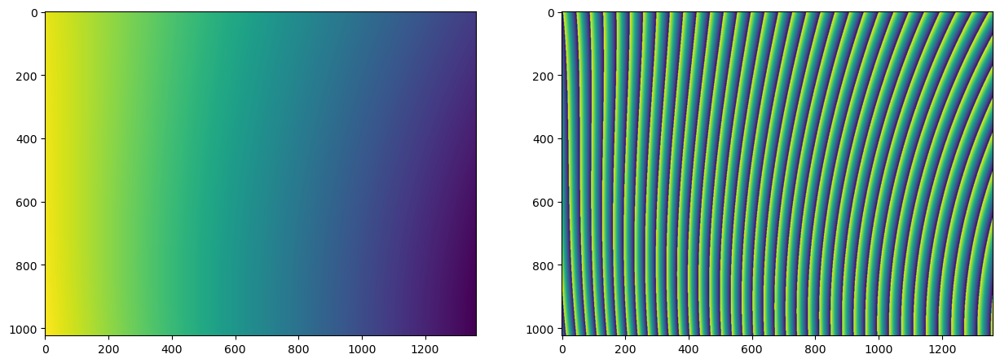

In [ ]:
fig, axs = plt.subplots(1, 2, figsize=(15, 8))

axs[1].imshow(torch.angle(wave).detach())
axs[0].imshow(wave_phase.detach())

coeffs

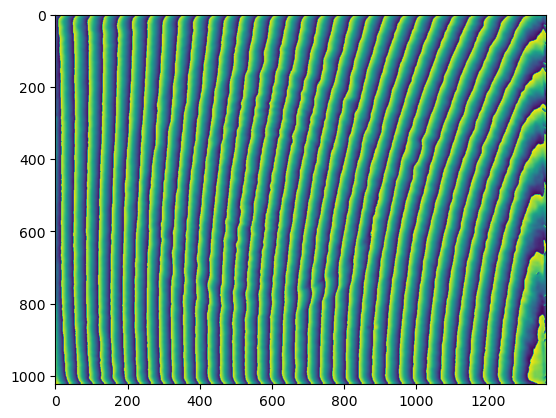

In [ ]:
plt.imshow(wave_z.detach().T)

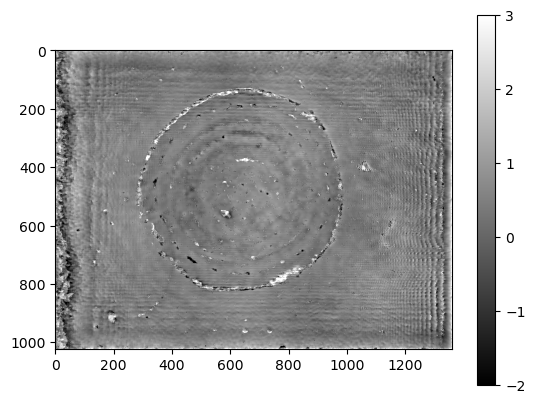

In [ ]:
plt.imshow((obj_phase.detach().numpy()), cmap='gray', vmin=-2, vmax=3)
plt.colorbar()